In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from utils.CaImageCSV import CaImageCSV
import utils.sulfur.constant as const

In [15]:
animal_name = 'ID181106CreC'
file_path = './resources/%s_Longitudinal_Traces.csv' % animal_name
csv = CaImageCSV(file_path)

/opt/conda/lib/python3.8/site-packages/pandas/core/indexing.py:1843: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value
/opt/conda/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


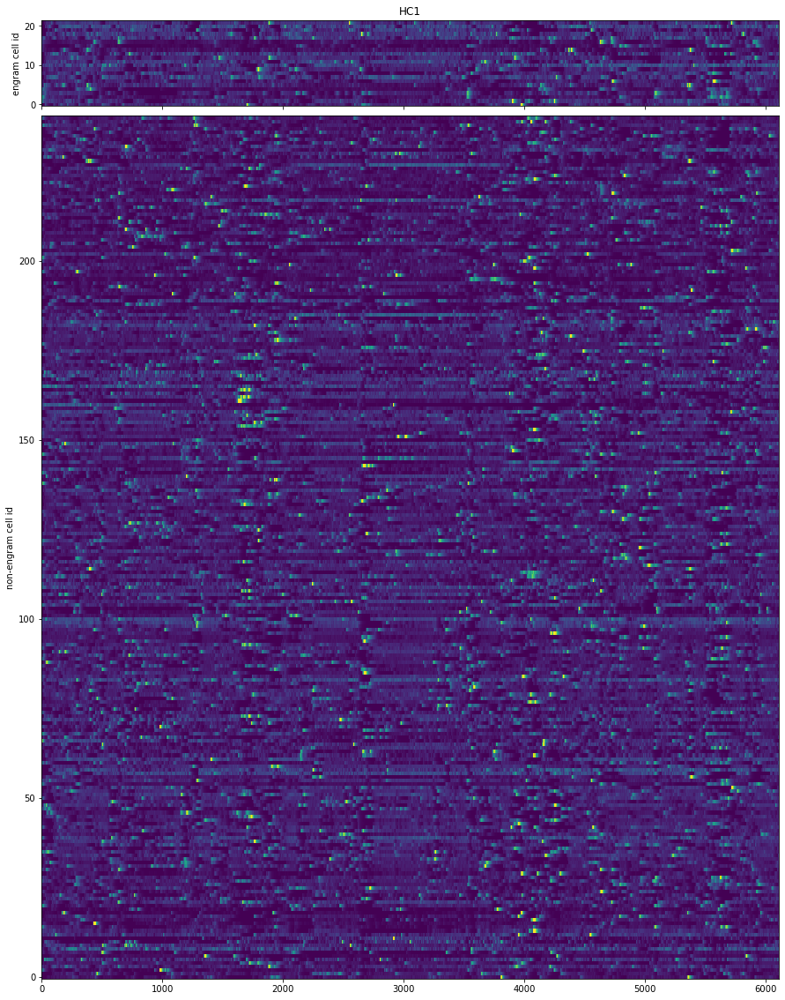

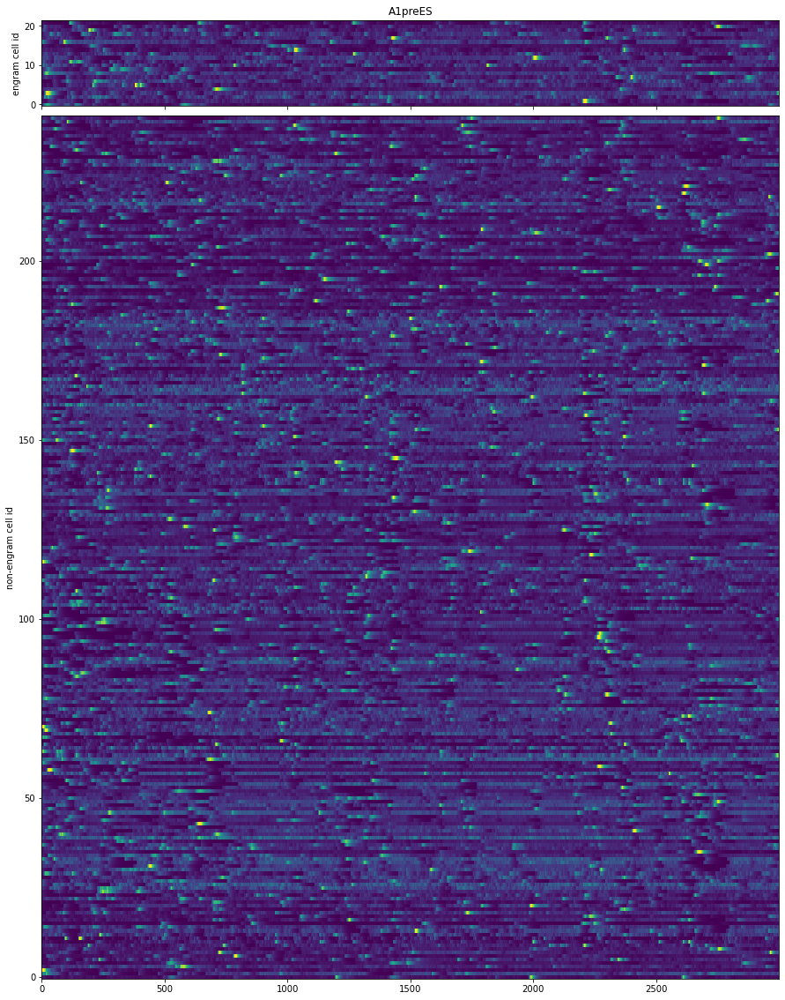

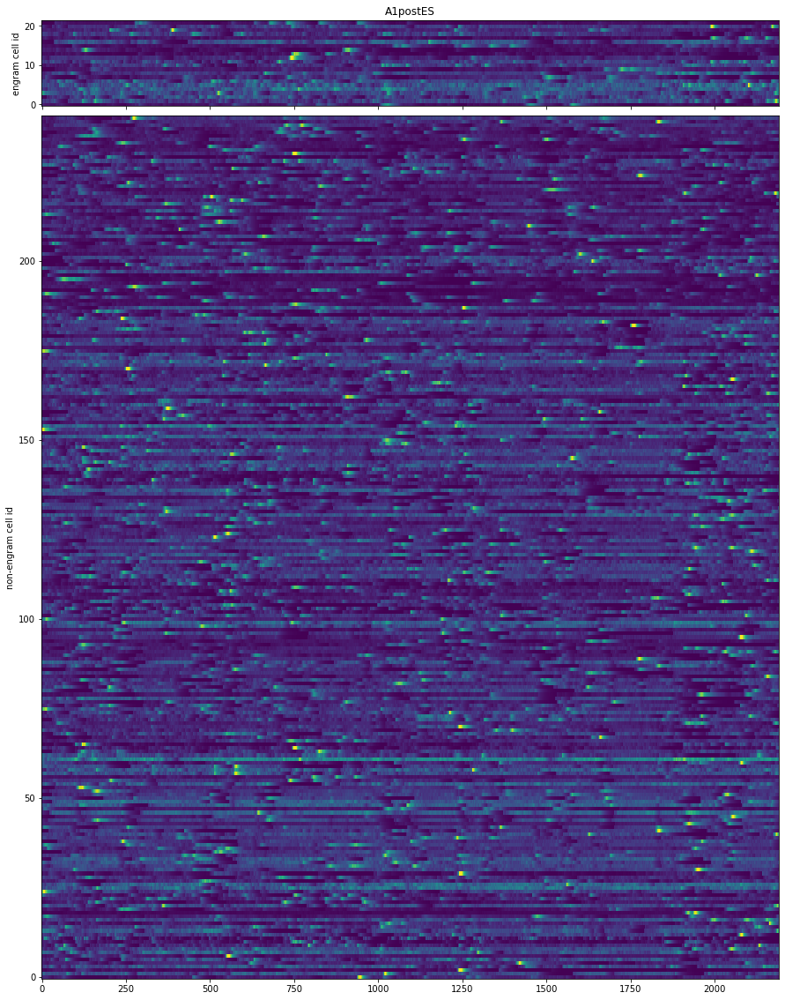

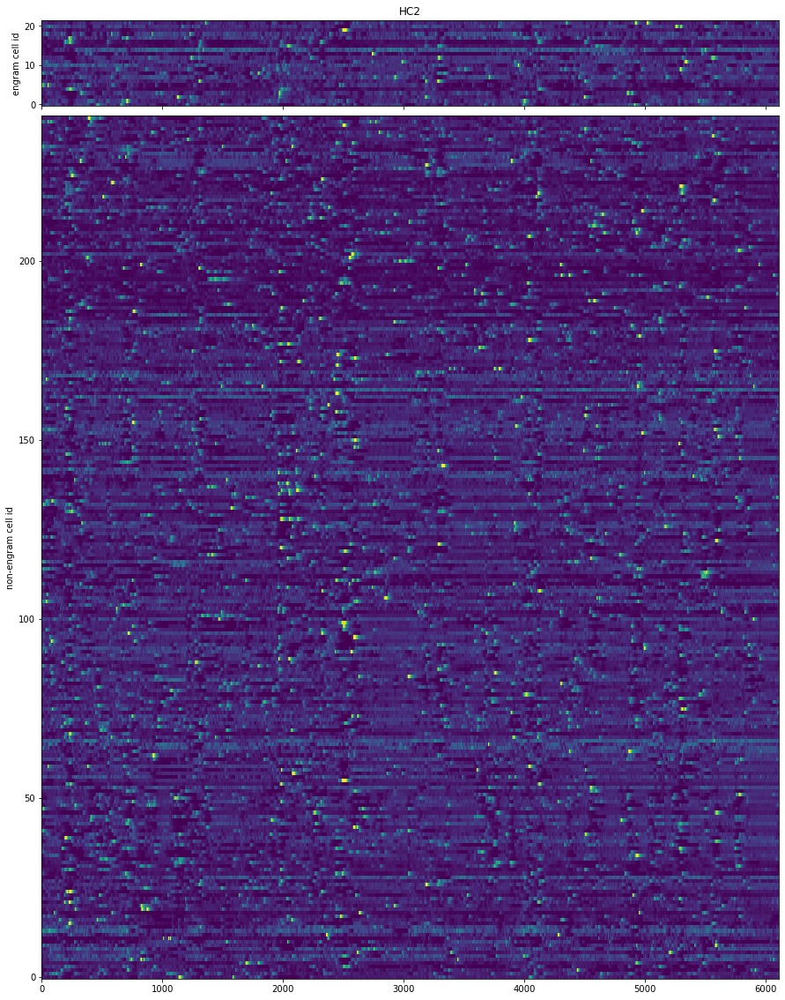

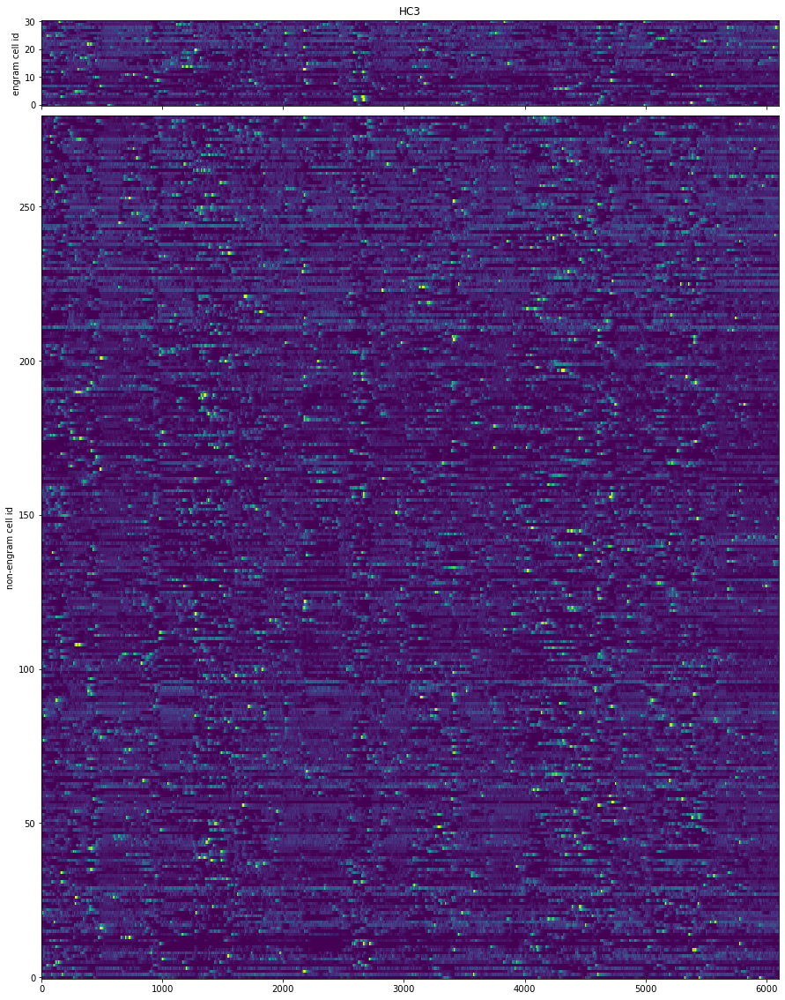

...

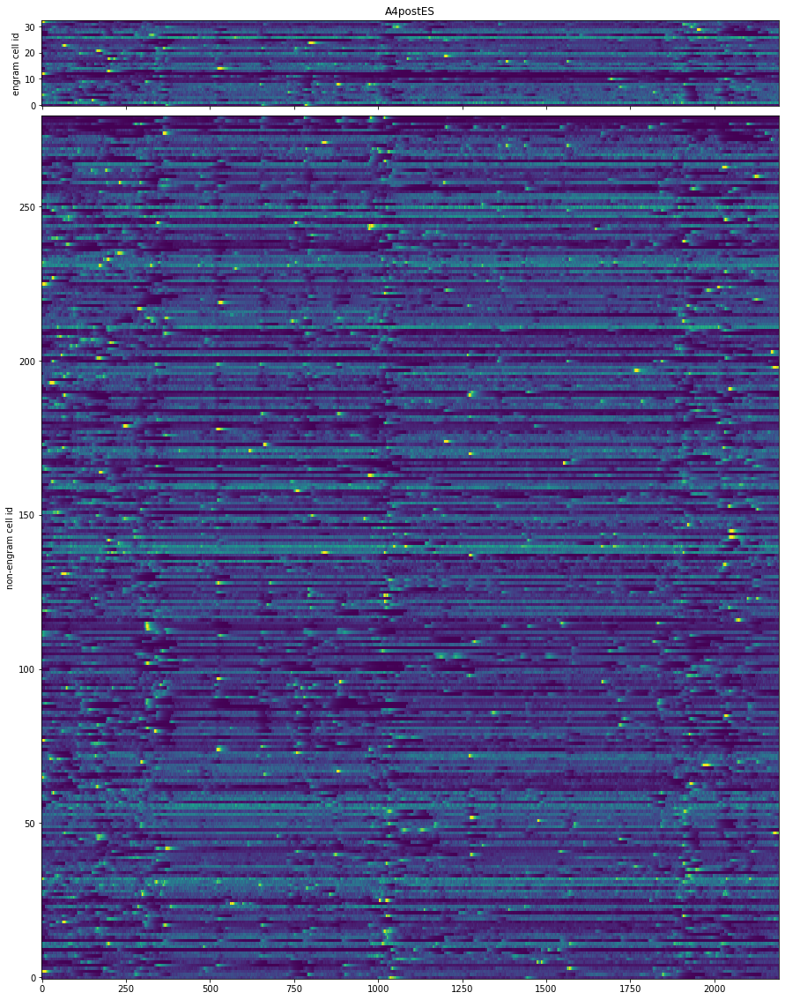

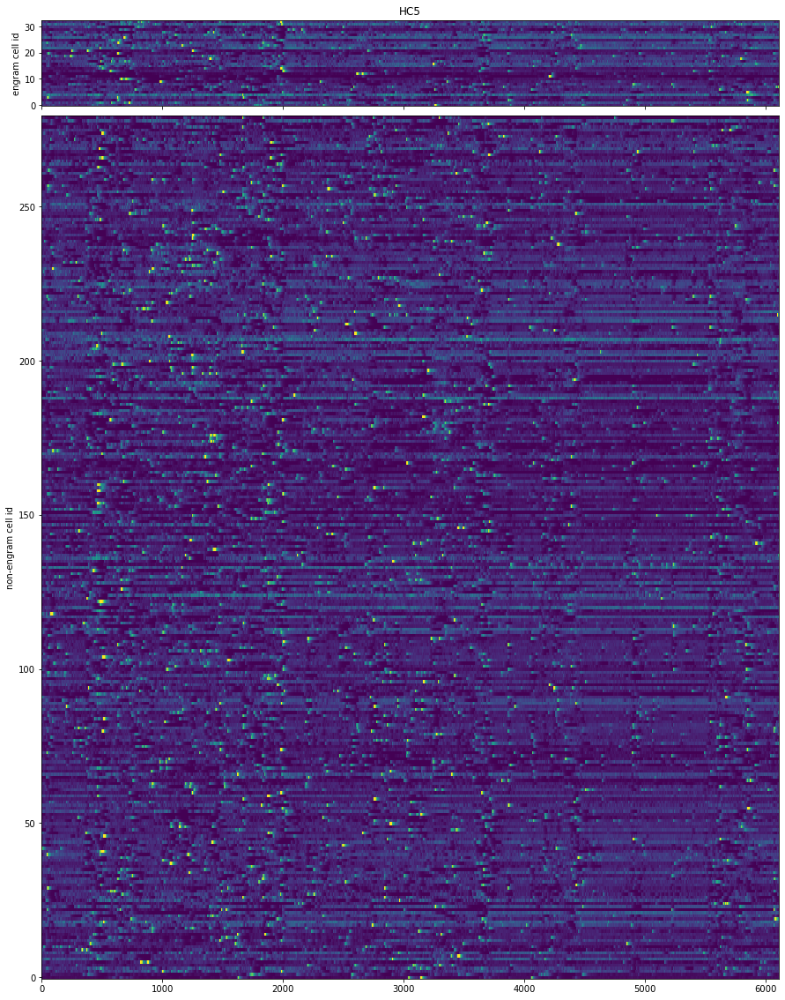

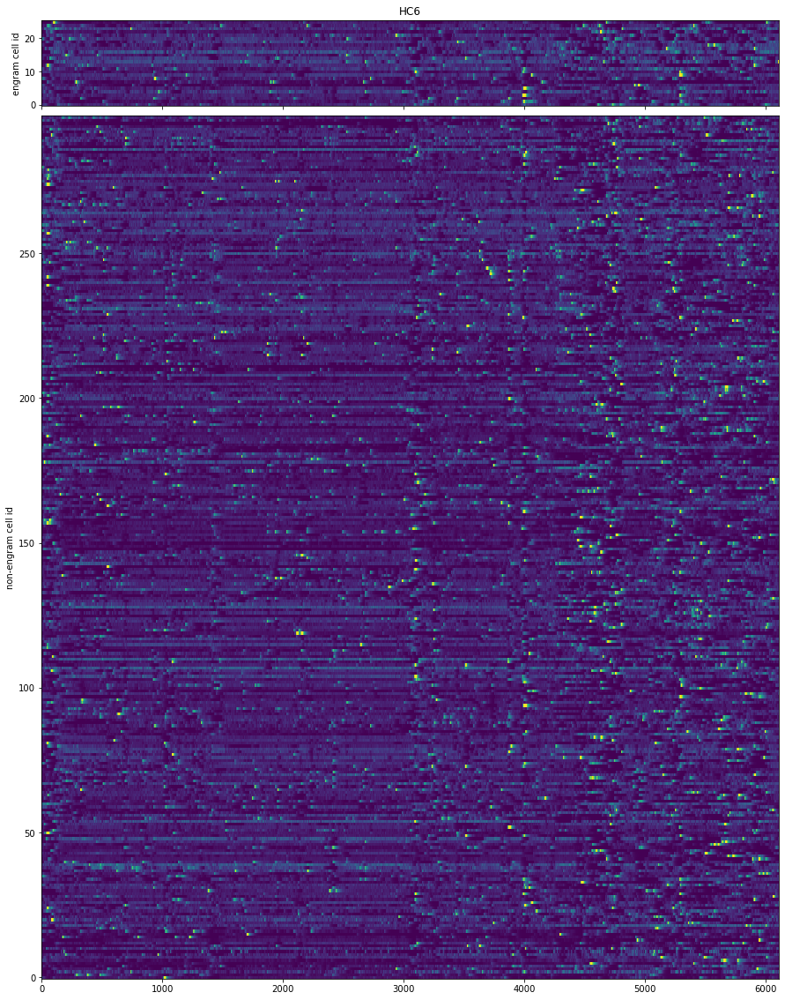

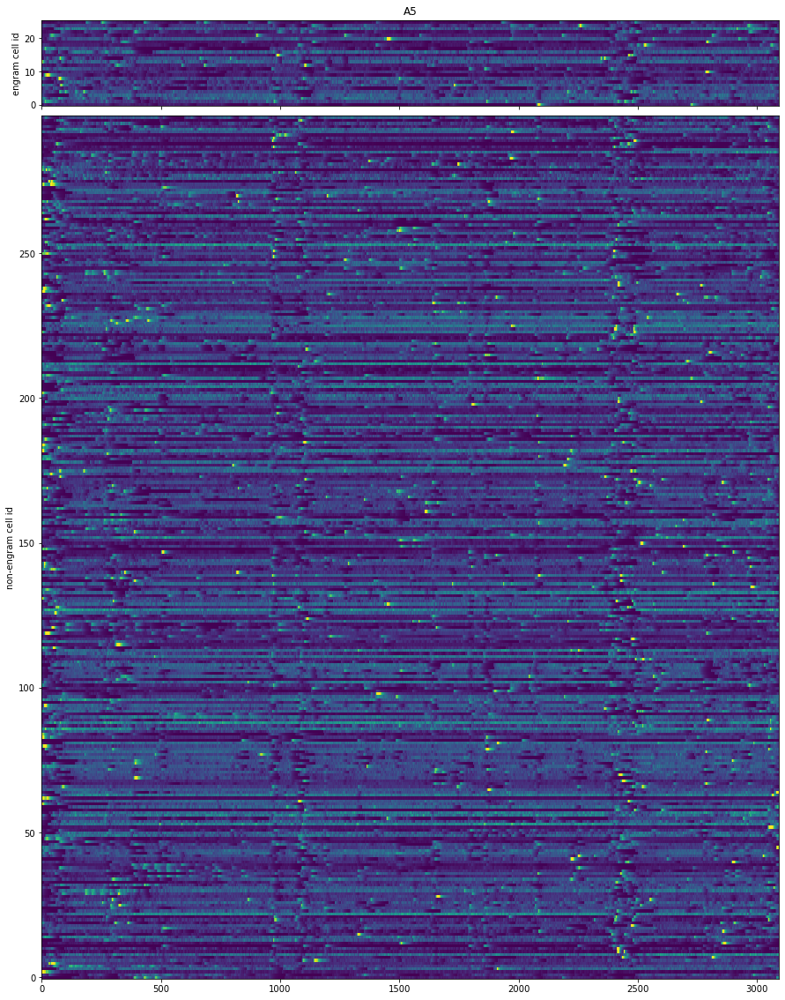

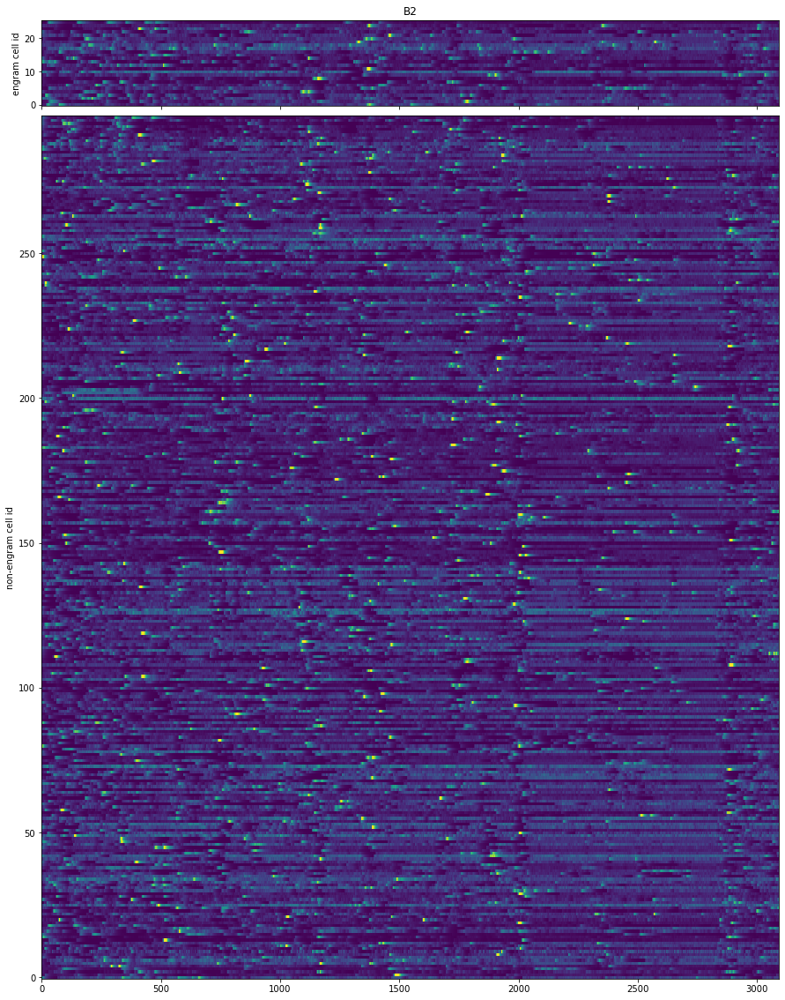

In [8]:
engram_cells = csv.engram_cells()
non_engram_cells = csv.non_engram_cells()
for context_name in const.CONTEXTS:
    fig, aixs = plt.subplots(2, figsize=(15, 20), sharex=True, gridspec_kw={'height_ratios': [1, len(non_engram_cells) // len(engram_cells)]})
    
    context_data = csv.filtered_by_context(context_name)
    context_data = context_data.astype(float)
    context_data = context_data.dropna(how='all', axis=1)
    valueable_cells = context_data.columns
    valuable_engram_cells = []
    for cell_name in engram_cells:
        if cell_name in valueable_cells:
            valuable_engram_cells.append(cell_name)
          
    valuable_non_engram_cells = []
    for cell_name in non_engram_cells:
        if cell_name in valueable_cells:
            valuable_non_engram_cells.append(cell_name)
    
    optimized_data = csv.optimize_std(context_data.fillna(0.0, axis=1))
    
    engram_x = np.arange(0, len(context_data))
    engram_y = np.arange(0, len(valuable_engram_cells))
    engram_X, engram_Y = np.meshgrid(engram_x, engram_y)
    
    aixs[0].pcolormesh(engram_X, engram_Y, optimized_data.T.loc[valuable_engram_cells], shading='auto', vmin=0.0, vmax=10.0)
    aixs[0].set_ylabel('engram cell id')
    aixs[0].set_title(context_name)
    
    non_engram_x = np.arange(0, len(context_data))
    non_engram_y = np.arange(0, len(valuable_non_engram_cells))
    non_engram_X, non_engram_Y = np.meshgrid(non_engram_x, non_engram_y)
    
    aixs[1].pcolormesh(non_engram_X, non_engram_Y, optimized_data.T.loc[valuable_non_engram_cells], shading='auto', vmin=0.0, vmax=10.0)
    aixs[1].set_ylabel('non-engram cell id')
    
    plt.subplots_adjust(hspace=0.02)
    
    plt.show()
    # plt.savefig('./resources/normalized_colormap/ID181106CreC/%s.png' % context_name)

(2192, 22)
(400, 22)
(2192, 22)
(400, 22)
(2192, 22)
(398, 22)
(2192, 22)


TypeError: Dimensions of C (22, 398) are incompatible with X (400) and/or Y (22); see help(pcolormesh)

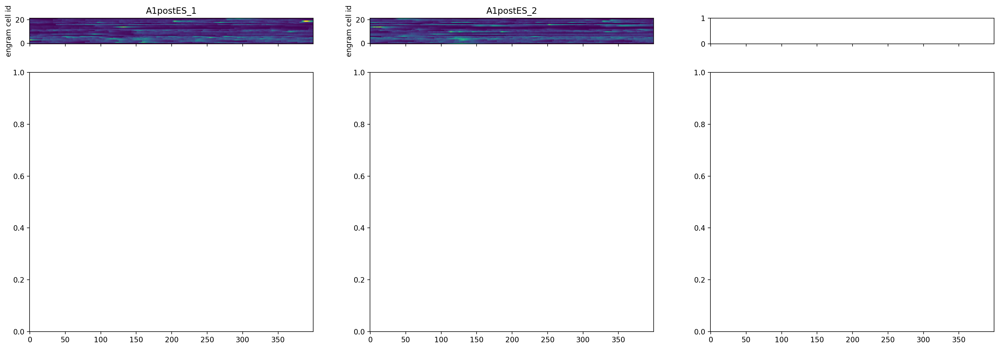

In [18]:
engram_cells = csv.engram_cells()
non_engram_cells = csv.non_engram_cells()
fig, aixs = plt.subplots(nrows=2, ncols=3, figsize=(24, 8), dpi=200, sharex=True, gridspec_kw={'height_ratios': [1, len(non_engram_cells) // len(engram_cells)]})
context_data = csv.filtered_by_context('A1postES')
context_data = context_data.astype(float)

engram_a1 = context_data.loc[:, engram_cells]
non_engram_a1 = context_data.loc[:, non_engram_cells]
engram_a1.dropna(how='all', axis=1, inplace=True)
non_engram_a1.dropna(how='all', axis=1, inplace=True)

optimized_engram = csv.optimize_std(engram_a1.fillna(0.0, axis=1))
optimized_non_engram = csv.optimize_std(non_engram_a1.fillna(0.0, axis=1))
print(optimized_engram.shape)
engram_A1_1 = optimized_engram.iloc[0:400, :]
print(engram_A1_1.shape)
print(optimized_engram.shape)
engram_A1_2 = optimized_engram.iloc[900:1300, :]
print(engram_A1_2.shape)
print(optimized_engram.shape)
engram_A1_3 = optimized_engram.iloc[1794:2194, :]
print(engram_A1_3.shape)
print(optimized_engram.shape)

non_engram_A1_1 = optimized_non_engram.iloc[0:400, :]
non_engram_A1_2 = optimized_non_engram.iloc[900:1300, :]
non_engram_A1_3 = optimized_non_engram.iloc[1794:2194, :]

engram_x = np.arange(0, len(engram_A1_1))
engram_y = np.arange(0, len(engram_A1_1.columns))
engram_X, engram_Y = np.meshgrid(engram_x, engram_y)

aixs[0][0].pcolormesh(engram_X, engram_Y, engram_A1_1.T, shading='auto', vmin=0.0, vmax=10.0)
aixs[0][0].set_ylabel('engram cell id')
aixs[0][0].set_title('A1postES_1')

aixs[0][1].pcolormesh(engram_X, engram_Y, engram_A1_2.T, shading='auto', vmin=0.0, vmax=10.0)
aixs[0][1].set_ylabel('engram cell id')
aixs[0][1].set_title('A1postES_2')

aixs[0][2].pcolormesh(engram_X, engram_Y, engram_A1_3.T, shading='auto', vmin=0.0, vmax=10.0)
aixs[0][2].set_ylabel('engram cell id')
aixs[0][2].set_title('A1postES_3')

non_engram_x = np.arange(0, len(non_engram_A1_1))
non_engram_y = np.arange(0, len(non_engram_A1_1.columns))
non_engram_X, non_engram_Y = np.meshgrid(non_engram_x, non_engram_y)

aixs[1][0].pcolormesh(non_engram_X, non_engram_Y, non_engram_A1_1.T, shading='auto', vmin=0.0, vmax=10.0)
aixs[1][0].set_ylabel('non-engram cell id')

aixs[1][1].pcolormesh(non_engram_X, non_engram_Y, non_engram_A1_2.T, shading='auto', vmin=0.0, vmax=10.0)
aixs[1][1].set_ylabel('non-engram cell id')

aixs[1][2].pcolormesh(non_engram_X, non_engram_Y, non_engram_A1_3.T, shading='auto', vmin=0.0, vmax=10.0)
aixs[1][2].set_ylabel('non-engram cell id')

plt.tight_layout()
plt.show()